# 🎭 **Project: GenFace – A Face-Generating GAN**
👩🏽‍💻 By Sapphire Oshodi -DataChicGirl
                                 



---


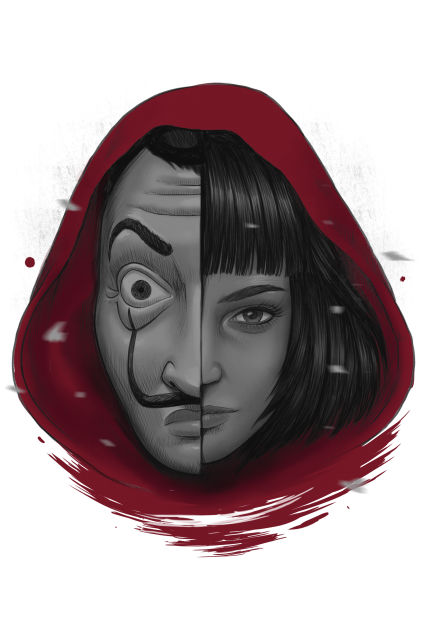


# 🚀 What I’m About to Do
I’m starting GenFace, a Deep Convolutional GAN (DCGAN) that will generate realistic human faces from random noise. This is part of my Generative AI class assessment, where I’ll explore how AI can create synthetic yet realistic images.

# 🎯 My Goals

- Train a DCGAN using the CelebA dataset.
- Implement a Generator that learns to create realistic faces.
-  Build a Discriminator to distinguish real from fake images.
- Normalize and preprocess images for stable training.
- Train the model over multiple epochs and visualize generated faces.

# 🛠️ Tools I’ll Be Using
🧑‍💻 Python | 🤖 TensorFlow/Keras | ☁️ Google Colab



# 🔨 My Plan
- ✅ Step 1: Setting up my Environment on Google Colab
- ✅ Step 2: Import Libraries – Set up TensorFlow, Keras, and other dependencies.
- ✅ Step 3: Get the Dataset – Load and explore the CelebA dataset.
- ✅ Step 4: Data Preparation – Preprocess and normalize images for training.
- ✅ Step 5: Define Networks – Build the Generator and Discriminator models.
- ✅ Step 6: Generate Initial Images – Check if the generator can produce any output.
- ✅ Step 7: Set Training Parameters – Define batch size, latent dimension, and epochs.
- ✅ Step 8: Implement Image Sampling – Write a function to save and display generated images.
- ✅ Step 9: Train the GAN – Train the Discriminator and Generator iteratively.
- ✅ Step 10: Evaluate Results –

 - Plot loss curves to monitor training progress.
 - Generate final images to inspect their quality.
 - Save the trained Generator model to--
Google Drive for future use.


# 🎨 Why This Project?
GANs are transforming AI creativity, from deepfakes to AI-assisted design. GenFace is my step into this fascinating world—teaching machines to imagine new faces!

💡 Let’s get started and create some AI-generated faces! 🚀🔥

# **🔧 Step 1: Setting Up the Environment**
Since I’m running this on Google Colab, I need to install some libraries first.

In [1]:
!pip install tensorflow tensorflow-gpu matplotlib tensorflow-datasets ipywidgets

  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Preparing metadata (setup.py) ... error
error: metadata-generation-failed

× Encountered error while generating package metadata.
╰─> See above for output.

note: This is an issue with the package mentioned above, not pip.
hint: See above for details.


### ✅ Why am I installing these?

```
- TensorFlow & TensorFlow-GPU: My deep learning powerhouse!
If Colab allows GPU access, my GAN will train faster.
- Matplotlib: Because we need to see the faces my AI creates! 🎭
- TensorFlow Datasets: To make it easier to fetch pre-built datasets.
- ipywidgets: For interactive elements in Colab (optional but fun!).
```



`✅TO CHECK IF GPU EXIST IN THE SYSTEM`

In [ ]:
import tensorflow as tf
print(f"Check my GPU", tf.config.list_physical_devices ("GPU"))

Check my GPU [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


# **🔨 Step 2: Importing Essential Libraries**
Now that we’ve set up our environment, it’s time to bring in the tools we need! Think of this as packing our AI toolkit before we start building.

In [2]:
# Import libraries
import os
import tensorflow as tf
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import zipfile




### ✅ Why these libraries?

- **os:** Helps us navigate the file system (like checking if datasets exist).
- **TensorFlow:** The core deep-learning framework or Powerhouse that powers our GAN.
- **NumPy:** Essential for handling the math / numbers behind GANs.
Pandas: Although not heavily used, just incase i want to manipulate datasets
- **Matplotlib:** Because what’s the point of a GAN if we don’t see its creations? 🎨  So we can see the faces we generate!
- **Zipfile:** Useful  for handling zip datasets.My dataset for this project comes in a compressed format.

🚀 Next up: Getting the dataset! Let’s fetch some real human faces to teach our GAN how to create its own! 🎭

# **📂 Step 3: Getting the Dataset**
Alright, time to bring in the data! Our GAN needs real faces to learn from, so let’s extract our dataset and get it ready.


**🔄 Unzipping the Dataset**

In [3]:
# Path to the ZIP file and dataset
zip_file = "/content/archive.zip"
dataset_dir = "/content/dataset"


# Extract the ZIP file
if not os.path.exists(dataset_dir):
    with zipfile.ZipFile(zip_file, 'r') as zip_ref:
        zip_ref.extractall(dataset_dir)
print(f"Dataset extracted to: {dataset_dir}")

Dataset extracted to: /content/dataset


**🧐 What’s Happening Here?**
- We define paths to our dataset file (archive.zip) and extraction folder (dataset).
- If the dataset isn’t already extracted, we unzip it into dataset_dir.






# **🏗️ Next: Loading the Dataset**
Now that our dataset is extracted, let’s load it and check out what we’re working with! 🎭

**🔍 Loading Image Attributes**

In [4]:
# Define the dataset directory
dataset_dir = "/content/dataset"
#Path to the folder containing face images
images_path = os.path.join(dataset_dir, "Images")
# Path to the attributes file
attributes_path = "/content/dataset/list_attribute.txt"

# Load attributes file
attributes = pd.read_csv(attributes_path, sep='\s+', skiprows=1, engine='python')

# Reset index and rename columns
attributes.reset_index(inplace=True)
attributes.rename(columns={'index': 'image_id'}, inplace=True)

# Display the first few rows to verify
print(attributes.head())


     image_id  5_o_Clock_Shadow  Arched_Eyebrows  Attractive  Bags_Under_Eyes  \
0  000001.jpg                -1                1           1               -1   
1  000002.jpg                -1               -1          -1                1   
2  000003.jpg                -1               -1          -1               -1   
3  000004.jpg                -1               -1           1               -1   
4  000005.jpg                -1                1           1               -1   

   Bald  Bangs  Big_Lips  Big_Nose  Black_Hair  ...  Sideburns  Smiling  \
0    -1     -1        -1        -1          -1  ...         -1        1   
1    -1     -1        -1         1          -1  ...         -1        1   
2    -1     -1         1        -1          -1  ...         -1       -1   
3    -1     -1        -1        -1          -1  ...         -1       -1   
4    -1     -1         1        -1          -1  ...         -1       -1   

   Straight_Hair  Wavy_Hair  Wearing_Earrings  Wearing_Hat  We

### 🧐 **What’s Happening Here?**
- We **define paths** for both:
  - `images_path` → The folder containing our face images.  
  - `attributes_path` → A text file with labels about the images (e.g., age, gender, smile).  
- We **load the attributes file** using `pandas`, ensuring we handle spacing correctly.  
- We **reset the index** and rename the first column to `"image_id"` for clarity.  
- Finally, we **print** the first few rows to see what the data looks like!  

🎯 **Why do this?** This lets us explore the dataset and confirm everything is loaded properly before training our GAN.  

💡 **Next up: Preprocessing the images!** 🚀

# **🎨 Step 4: Preparing and Preprocessing the Dataset**
Before training our GAN, we need to load, resize, and normalize our dataset so that the model learns effectively. Let's do it! 🚀


### **🛠 Loading and Processing CelebA Dataset**

Found 5017 files.


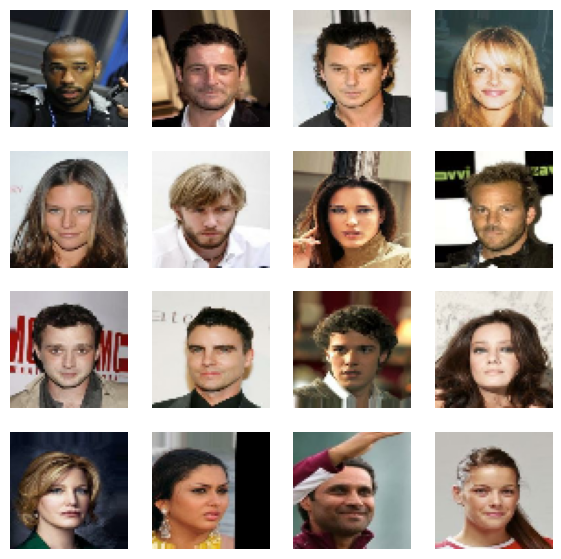

In [5]:
# Load CelebA dataset
data = tf.keras.preprocessing.image_dataset_from_directory(
    images_path,
    # No labels needed for GANs!
    label_mode=None,
    # Resize images to 64x64 for training
    image_size=(64, 64),
    # Process images in batches
    batch_size=128
)

# Normalize images to [-1,1]
def preprocess(img):
  # Scale pixel values
    return (tf.cast(img, tf.float32) / 127.5) - 1

# Apply preprocessing to dataset
data = data.map(lambda x: preprocess(x))

# Display sample images
plt.figure(figsize=(7, 7))

# Take 16 batches
for i, batch in enumerate(data.take(16)):
  # Extract the first image
    img = batch[0].numpy()
    plt.subplot(4, 4, i + 1)
    plt.axis("off")
    # Convert back to [0,1] for display
    plt.imshow((img + 1) / 2)

plt.show()


### **🔍 Why Normalize the Images?**
Think of it like this: GANs are like babies learning to recognize faces. If you give them messy, unbalanced input, they get confused. But if you scale everything properly, their learning becomes smoother and more efficient!

### 💡**Here’s why normalization matters:**

- ✅ GANs love balance! Keeping pixel values in the range [-1,1] helps them learn more naturally.
- ✅ Prevents brain freeze! Without this, our GAN might struggle with vanishing gradients, making training painfully slow.
- ✅ Keeps images crisp! When generating faces, normalized training helps produce realistic results.

**🎉 Boom**! Now we have 5,017 faces loaded, cleaned, and ready for training.

🚀 Next up: Time to build the brain of our AI artist—the Generator!
Let’s make AI dream up some faces! 🎨🔥

# **🎨 Step 5: Building the Generator – The AI Artist And Building The Discriminator – The AI Art Critic! 🧐**


🧠 Imagine a blank canvas and an AI trying to paint a face from pure imagination—that’s our Generator! It takes in random noise and transforms it into something recognizable. It starts with a 100-dimensional random vector and gradually upsamples it into a 64x64x3 image.

## **🛠 Create Generator**

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


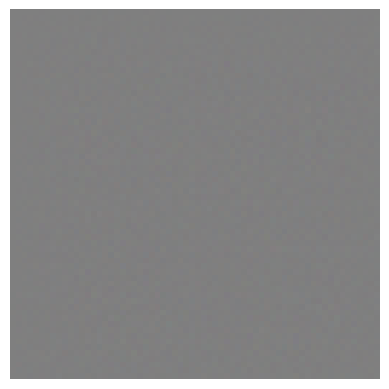

In [6]:
from tensorflow.keras import layers

def build_generator():
    model = tf.keras.Sequential([
        layers.Dense(8 * 8 * 256, use_bias=False, input_shape=(100,)),
        layers.BatchNormalization(),
        layers.LeakyReLU(),

        layers.Reshape((8, 8, 256)),

        layers.Conv2DTranspose(128, (5,5), strides=(2,2), padding='same', use_bias=False),
        layers.BatchNormalization(),
        layers.LeakyReLU(),

        layers.Conv2DTranspose(64, (5,5), strides=(2,2), padding='same', use_bias=False),
        layers.BatchNormalization(),
        layers.LeakyReLU(),

        layers.Conv2DTranspose(3, (5,5), strides=(2,2), padding='same', activation='tanh') # Output 64x64x3
    ])

    return model

# Test generator output
generator = build_generator()
noise = tf.random.normal([1, 100])
generated_image = generator(noise, training=False)
plt.imshow((generated_image[0] + 1) / 2)
plt.axis("off")
plt.show()


---

### 🎯 **How It Works:**  
✅ **Dense Layer:** Expands the **100-dimensional noise vector** into a **spatial 8x8x256 representation**.  
✅ **Reshape:** Converts it into a small **8x8 image with 256 feature maps**.  
✅ **Conv2DTranspose:** **Upscales the image** step by step (8x8 → 16x16 → 32x32 → 64x64).  
✅ **LeakyReLU + BatchNorm:** Ensures **smooth learning** and prevents training instability.  
✅ **Final Layer (tanh):** Outputs a **64x64x3 image** with pixel values between **-1 and 1** (normalized).  

---

### 🧪 **First Results – Does It Work?**  
🔍 When I run it, I see a **randomly generated** blurry face.  
🖼 **Right now, it’s a mess**—not fine at all... ko da ra ra🤡 lol! But I don’t need to worry, training will make it **crisper** over time!  

🚀 **Next Up: The Discriminator – The AI Art Critic!** 🧐  

---



## 🎭 **Meet The Discriminator – The AI Art Critic!** 🧐  
While the **Generator** creates faces, the **Discriminator** is here to **judge** them. It decides if an image is:  
✅ **Real** (from the CelebA dataset) or  
❌ **Fake** (from the Generator).  





### **CREATE DISCRIMINATOR**





In [7]:
def build_discriminator():
    model = tf.keras.Sequential([
        layers.Conv2D(64, (5,5), strides=(2,2), padding='same', input_shape=[64, 64, 3]),
        layers.LeakyReLU(),
        layers.Dropout(0.3),

        layers.Conv2D(128, (5,5), strides=(2,2), padding='same'),
        layers.LeakyReLU(),
        layers.Dropout(0.3),

        layers.Flatten(),
        layers.Dense(1, activation='sigmoid')  # Output: Probability of being real
    ])

    return model

# Test discriminator output
discriminator = build_discriminator()
decision = discriminator(generated_image)
print(decision)


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


tf.Tensor([[0.5001236]], shape=(1, 1), dtype=float32)


### 🎯 **How It Works:**  
✅ **Convolutional Layers:** Extracts important features from the **64x64 image**.  
✅ **LeakyReLU:** Prevents dead neurons and keeps training stable.  
✅ **Dropout (0.3):** Helps avoid **overfitting** by randomly dropping connections.  
✅ **Flatten + Dense:** Converts extracted features into a **single probability** (0 = fake, 1 = real).  
✅ **Sigmoid Activation:** Outputs a value between **0 and 1**, representing confidence in authenticity.  

---

### 🧪 **First Test – Can It Judge?**  
🖼 When I pass a **generated image** through the Discriminator, it spits out a number. **Near 1?** It thinks it’s real. **Near 0?** It knows it’s fake.  

🧐 **Right now, it’s just guessing!** The real magic happens when we train both models together... and let the **AI rivalry begin!** 🔥🤖💥  


# 🛠 **Step 6: Create the generator amd discriminator losses**

---

### 🎯 **The AI Training Strategy – Teaching the Opponents!** 🏋️‍♂️🤖  

Now that our **Generator** and **Discriminator** are ready, we need to **train them properly** so they get **smarter** over time.

Here’s how:  


### 🔥 **How Do We Teach Them?**  

✅ **Step 1: Define a Loss Function** 🎯  
- This tells our models **how bad** their mistakes are so they can improve.  
- We use **Binary Cross-Entropy** (BCE) – a fancy way to compare **real vs. fake** probabilities.  

---

### 🔥 **How Do We Teach Them?**  

✅ **Step 1: Define a Loss Function** 🎯  
- This tells our models **how bad** their mistakes are so they can improve.  
- We use **Binary Cross-Entropy** (BCE) – a fancy way to compare **real vs. fake** probabilities.  

✅ **Step 2: Train the Discriminator** 🛡️  
- Reward it for correctly identifying **real images** as **real** (1).  
- Reward it for correctly identifying **fake images** as **fake** (0).  
- If it **fails**, update its weights to become a better **art critic**.  



In [8]:
### Create the generator amd discriminator losses
# Loss function
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=False)

# Discriminator loss
def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    return real_loss + fake_loss

✅ **Step 3: Train the Generator** 🎨  
- It must create **fake images so good** that the Discriminator **mistakes them for real ones**.  
- We make the Generator think **all its images should be real (1)**—forcing it to improve.  



In [9]:
# Generator loss
def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)


✅ **Step 4: Use Adam Optimizers** 🚀  
- These help both models **learn efficiently** by adjusting their weights over time.  
- We use a **learning rate of 1e-4** to **keep training stable** and avoid crazy jumps.  



In [10]:
# Optimizers
generator_optimizer = tf.keras.optimizers.Adam(1e-4)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4)


---

### 🧪 **What Happens Next?**  
1️⃣ At first, the **Generator is terrible** – its faces look like **random noise** 🤣.  
2️⃣ Over time, it **learns to create more realistic images** 👀.  
3️⃣ The **Discriminator gets tricked more often**, meaning the Generator is winning! 💥  
4️⃣ We keep training **until the Generator makes faces that look completely real!** 🎨🔥  

---

### 🎬 **Next Up: The GAN Training Loop – The Ultimate AI Showdown!** 🥊🤖  
Are you ready for this **epic training battle**? **LET’S GO!** 🚀🔥

---

### 🎬 **Step 7: The GAN Training Loop – Let the Battle Begin!** 🥊🤖  

Now, it's time for the **real showdown!** We’re bringing our **Generator** and **Discriminator** into the ring and training them **together**.  

---

### 🎯 **How Does Training Work?**  

✅ **Step 1: Pick a Batch of Real Images** 📸  
- We take a batch from our dataset (size: `batch_size = 128`).  

✅ **Step 2: Generate Fake Images** 🎨  
- We pass **random noise** (100-dimensional vector) into the **Generator**.  
- It **creates fake images**, which are then judged by the **Discriminator**.  

✅ **Step 3: Train the Discriminator** 🧐  
- It learns to **differentiate real and fake images** using **cross-entropy loss**.  

✅ **Step 4: Train the Generator** 🚀  
- It **tries to trick** the Discriminator into believing its **fake images are real**.  
- The **better it gets, the more realistic faces it generates**.  

✅ **Step 5: Save & Visualize Progress** 📊  
- Every **50 epochs**, we **generate sample images** to **see improvements** over time.  
- We **save these images** as files so we can compare results later.  

✅ **Step 6: Train Until It’s Convincing** 🔥  
- Over **1,200 epochs**, the Generator improves, producing **increasingly realistic faces**.  



Epoch 0, Gen Loss: 0.8137, Disc Loss: 0.8927
Epoch 0, Generating Images...


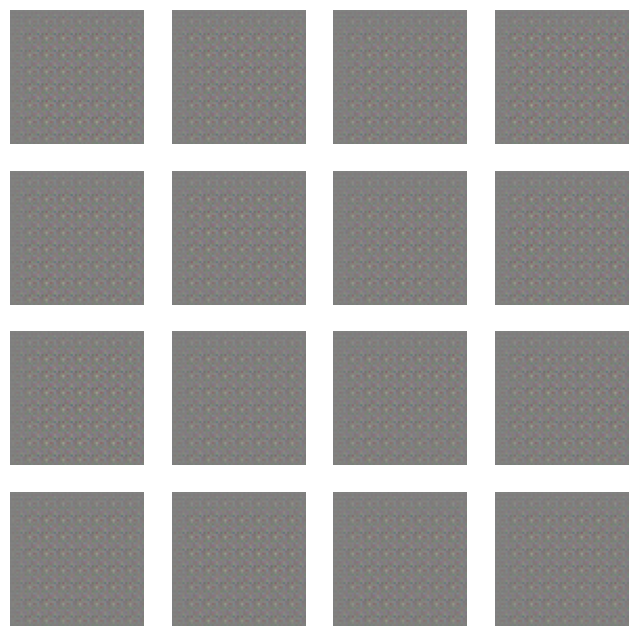

Time for epoch 1 is 13.28 sec
Epoch 1, Gen Loss: 2.2593, Disc Loss: 0.2501
Time for epoch 2 is 5.13 sec
Epoch 2, Gen Loss: 3.2440, Disc Loss: 0.0987
Time for epoch 3 is 3.88 sec
Epoch 3, Gen Loss: 4.1058, Disc Loss: 0.0509
Time for epoch 4 is 5.11 sec
Epoch 4, Gen Loss: 4.6833, Disc Loss: 0.0587
Time for epoch 5 is 3.80 sec
Epoch 5, Gen Loss: 4.4510, Disc Loss: 0.1239
Time for epoch 6 is 3.94 sec
Epoch 6, Gen Loss: 4.0298, Disc Loss: 0.5030
Time for epoch 7 is 3.81 sec
Epoch 7, Gen Loss: 2.9104, Disc Loss: 0.7150
Time for epoch 8 is 5.11 sec
Epoch 8, Gen Loss: 2.7623, Disc Loss: 0.3662
Time for epoch 9 is 3.89 sec
Epoch 9, Gen Loss: 2.1713, Disc Loss: 0.5317
Time for epoch 10 is 5.11 sec
Epoch 10, Gen Loss: 1.7363, Disc Loss: 0.6533
Time for epoch 11 is 3.91 sec
Epoch 11, Gen Loss: 1.8848, Disc Loss: 0.6936
Time for epoch 12 is 3.88 sec
Epoch 12, Gen Loss: 1.6982, Disc Loss: 0.9407
Time for epoch 13 is 5.11 sec
Epoch 13, Gen Loss: 1.3033, Disc Loss: 1.2454
Time for epoch 14 is 5.11 sec

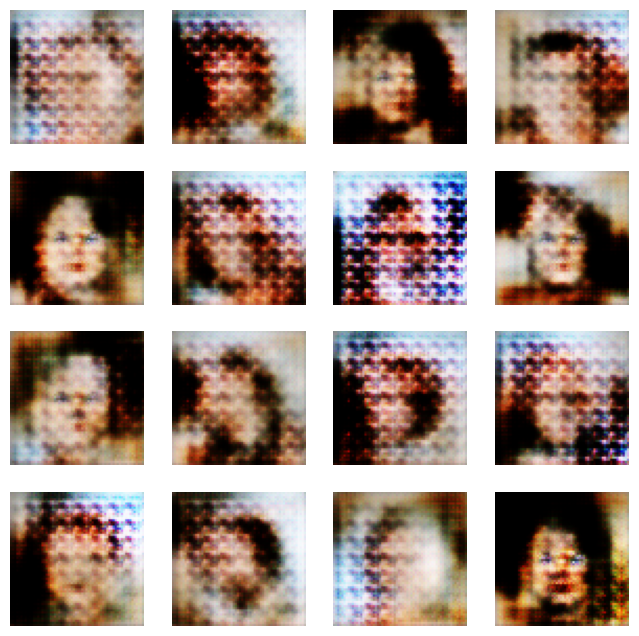

Time for epoch 51 is 4.98 sec
Epoch 51, Gen Loss: 1.0407, Disc Loss: 1.2779
Time for epoch 52 is 5.12 sec
Epoch 52, Gen Loss: 1.0923, Disc Loss: 1.0336
Time for epoch 53 is 4.21 sec
Epoch 53, Gen Loss: 1.1104, Disc Loss: 1.0316
Time for epoch 54 is 4.11 sec
Epoch 54, Gen Loss: 1.0273, Disc Loss: 1.2249
Time for epoch 55 is 4.15 sec
Epoch 55, Gen Loss: 1.1614, Disc Loss: 1.0213
Time for epoch 56 is 5.12 sec
Epoch 56, Gen Loss: 1.0992, Disc Loss: 1.1934
Time for epoch 57 is 4.12 sec
Epoch 57, Gen Loss: 1.2683, Disc Loss: 1.0196
Time for epoch 58 is 5.11 sec
Epoch 58, Gen Loss: 1.2637, Disc Loss: 1.0644
Time for epoch 59 is 4.07 sec
Epoch 59, Gen Loss: 1.2004, Disc Loss: 0.9795
Time for epoch 60 is 5.11 sec
Epoch 60, Gen Loss: 1.1168, Disc Loss: 0.9926
Time for epoch 61 is 5.12 sec
Epoch 61, Gen Loss: 1.1306, Disc Loss: 1.2084
Time for epoch 62 is 4.03 sec
Epoch 62, Gen Loss: 1.5568, Disc Loss: 0.8442
Time for epoch 63 is 5.11 sec
Epoch 63, Gen Loss: 1.1722, Disc Loss: 1.0626
Time for epo

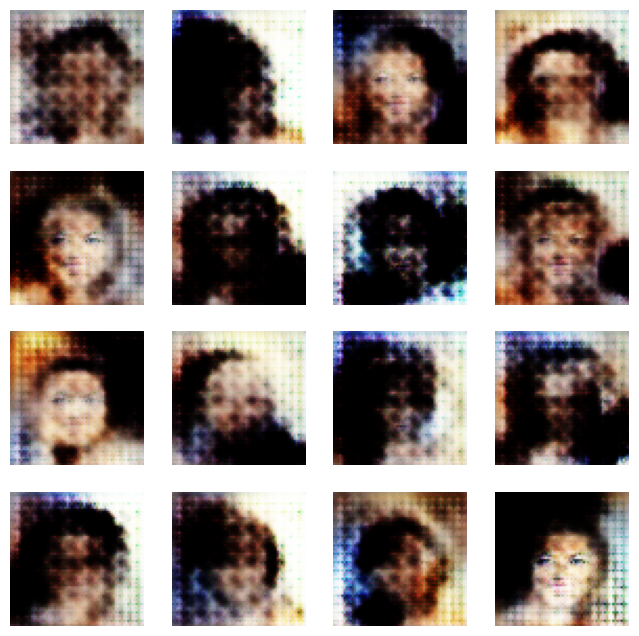

Time for epoch 101 is 6.15 sec
Epoch 101, Gen Loss: 1.4412, Disc Loss: 1.0449
Time for epoch 102 is 5.13 sec
Epoch 102, Gen Loss: 1.2254, Disc Loss: 1.2258
Time for epoch 103 is 5.12 sec
Epoch 103, Gen Loss: 1.2087, Disc Loss: 1.2446
Time for epoch 104 is 5.11 sec
Epoch 104, Gen Loss: 1.3591, Disc Loss: 1.0391
Time for epoch 105 is 4.16 sec
Epoch 105, Gen Loss: 1.3065, Disc Loss: 0.9933
Time for epoch 106 is 5.11 sec
Epoch 106, Gen Loss: 1.1429, Disc Loss: 1.0504
Time for epoch 107 is 4.15 sec
Epoch 107, Gen Loss: 1.2930, Disc Loss: 0.9625
Time for epoch 108 is 5.12 sec
Epoch 108, Gen Loss: 1.2151, Disc Loss: 1.0169
Time for epoch 109 is 5.11 sec
Epoch 109, Gen Loss: 1.0591, Disc Loss: 1.3383
Time for epoch 110 is 5.11 sec
Epoch 110, Gen Loss: 1.3456, Disc Loss: 0.9399
Time for epoch 111 is 4.14 sec
Epoch 111, Gen Loss: 1.2859, Disc Loss: 0.9854
Time for epoch 112 is 4.22 sec
Epoch 112, Gen Loss: 1.1848, Disc Loss: 1.1457
Time for epoch 113 is 4.06 sec
Epoch 113, Gen Loss: 1.4636, Disc

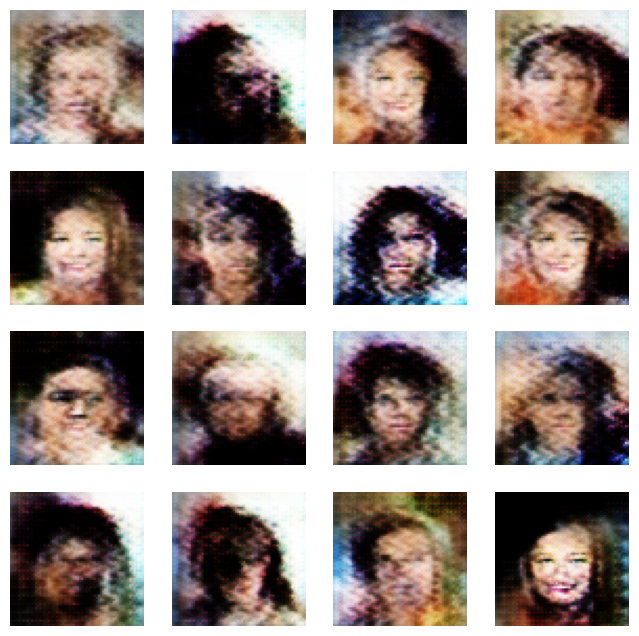

Time for epoch 151 is 4.82 sec
Epoch 151, Gen Loss: 1.4249, Disc Loss: 0.8878
Time for epoch 152 is 4.18 sec
Epoch 152, Gen Loss: 1.4023, Disc Loss: 0.9284
Time for epoch 153 is 5.11 sec
Epoch 153, Gen Loss: 1.4758, Disc Loss: 0.7785
Time for epoch 154 is 4.06 sec
Epoch 154, Gen Loss: 1.4544, Disc Loss: 0.9117
Time for epoch 155 is 4.07 sec
Epoch 155, Gen Loss: 1.5758, Disc Loss: 0.8409
Time for epoch 156 is 4.17 sec
Epoch 156, Gen Loss: 1.4530, Disc Loss: 0.9059
Time for epoch 157 is 4.06 sec
Epoch 157, Gen Loss: 1.5256, Disc Loss: 0.9087
Time for epoch 158 is 5.11 sec
Epoch 158, Gen Loss: 1.4631, Disc Loss: 1.0781
Time for epoch 159 is 4.20 sec
Epoch 159, Gen Loss: 1.6854, Disc Loss: 0.7586
Time for epoch 160 is 5.11 sec
Epoch 160, Gen Loss: 1.3189, Disc Loss: 1.1689
Time for epoch 161 is 4.08 sec
Epoch 161, Gen Loss: 1.5940, Disc Loss: 0.9938
Time for epoch 162 is 5.11 sec
Epoch 162, Gen Loss: 1.6802, Disc Loss: 1.0080
Time for epoch 163 is 5.11 sec
Epoch 163, Gen Loss: 1.3874, Disc

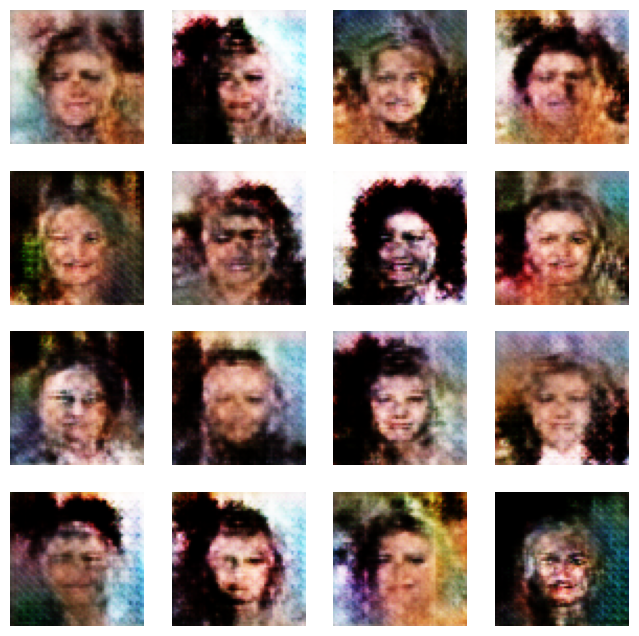

Time for epoch 201 is 5.74 sec
Epoch 201, Gen Loss: 1.5291, Disc Loss: 0.9819
Time for epoch 202 is 5.12 sec
Epoch 202, Gen Loss: 1.7208, Disc Loss: 0.7073
Time for epoch 203 is 5.12 sec
Epoch 203, Gen Loss: 1.5515, Disc Loss: 0.8884
Time for epoch 204 is 5.11 sec
Epoch 204, Gen Loss: 1.6371, Disc Loss: 0.7629
Time for epoch 205 is 5.12 sec
Epoch 205, Gen Loss: 1.5626, Disc Loss: 0.9146
Time for epoch 206 is 4.06 sec
Epoch 206, Gen Loss: 1.5486, Disc Loss: 0.8881
Time for epoch 207 is 5.11 sec
Epoch 207, Gen Loss: 1.5097, Disc Loss: 0.9608
Time for epoch 208 is 4.06 sec
Epoch 208, Gen Loss: 1.9076, Disc Loss: 0.6373
Time for epoch 209 is 5.11 sec
Epoch 209, Gen Loss: 1.7291, Disc Loss: 0.8556
Time for epoch 210 is 5.11 sec
Epoch 210, Gen Loss: 1.7012, Disc Loss: 0.8419
Time for epoch 211 is 4.13 sec
Epoch 211, Gen Loss: 1.7925, Disc Loss: 0.7493
Time for epoch 212 is 5.11 sec
Epoch 212, Gen Loss: 1.9449, Disc Loss: 0.6442
Time for epoch 213 is 5.12 sec
Epoch 213, Gen Loss: 1.6611, Disc

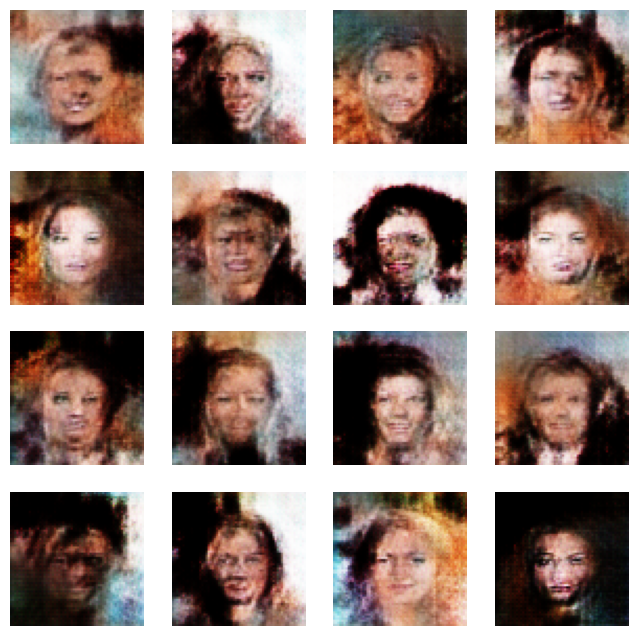

Time for epoch 251 is 4.68 sec
Epoch 251, Gen Loss: 1.7135, Disc Loss: 0.8977
Time for epoch 252 is 5.12 sec
Epoch 252, Gen Loss: 2.0147, Disc Loss: 0.7008
Time for epoch 253 is 5.11 sec
Epoch 253, Gen Loss: 1.6652, Disc Loss: 0.9137
Time for epoch 254 is 4.06 sec
Epoch 254, Gen Loss: 1.5611, Disc Loss: 0.9159
Time for epoch 255 is 5.11 sec
Epoch 255, Gen Loss: 1.7903, Disc Loss: 0.6701
Time for epoch 256 is 4.05 sec
Epoch 256, Gen Loss: 1.6898, Disc Loss: 0.8312
Time for epoch 257 is 4.07 sec
Epoch 257, Gen Loss: 1.4550, Disc Loss: 1.1589
Time for epoch 258 is 5.12 sec
Epoch 258, Gen Loss: 1.6139, Disc Loss: 0.8718
Time for epoch 259 is 4.14 sec
Epoch 259, Gen Loss: 1.6474, Disc Loss: 0.9565
Time for epoch 260 is 5.11 sec
Epoch 260, Gen Loss: 1.6939, Disc Loss: 0.8671
Time for epoch 261 is 4.10 sec
Epoch 261, Gen Loss: 1.7384, Disc Loss: 0.8271
Time for epoch 262 is 5.11 sec
Epoch 262, Gen Loss: 1.5129, Disc Loss: 0.8486
Time for epoch 263 is 5.11 sec
Epoch 263, Gen Loss: 1.7820, Disc

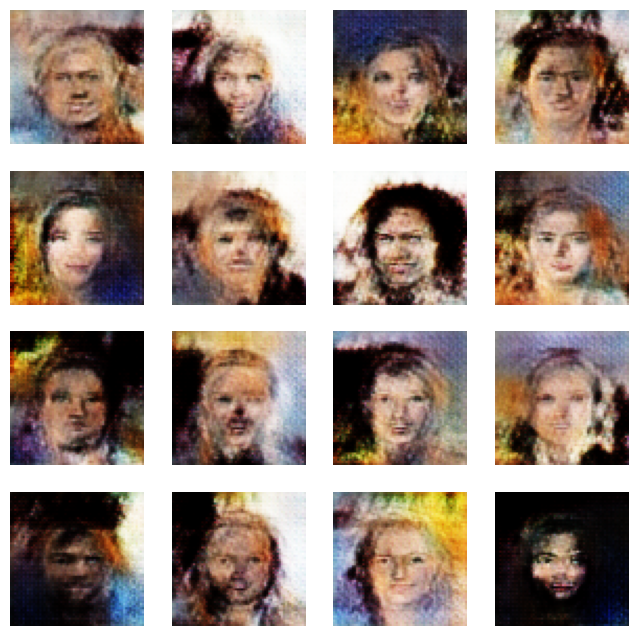

Time for epoch 301 is 5.75 sec
Epoch 301, Gen Loss: 1.8900, Disc Loss: 0.7718
Time for epoch 302 is 5.12 sec
Epoch 302, Gen Loss: 2.2301, Disc Loss: 0.6823
Time for epoch 303 is 4.07 sec
Epoch 303, Gen Loss: 1.6231, Disc Loss: 1.0640
Time for epoch 304 is 4.07 sec
Epoch 304, Gen Loss: 1.7498, Disc Loss: 0.8801
Time for epoch 305 is 4.14 sec
Epoch 305, Gen Loss: 2.2330, Disc Loss: 0.7407
Time for epoch 306 is 5.11 sec
Epoch 306, Gen Loss: 2.3229, Disc Loss: 0.7002
Time for epoch 307 is 4.12 sec
Epoch 307, Gen Loss: 2.0498, Disc Loss: 0.7742
Time for epoch 308 is 5.11 sec
Epoch 308, Gen Loss: 1.7025, Disc Loss: 0.8052
Time for epoch 309 is 5.12 sec
Epoch 309, Gen Loss: 1.9362, Disc Loss: 0.5975
Time for epoch 310 is 4.15 sec
Epoch 310, Gen Loss: 1.8800, Disc Loss: 0.7364
Time for epoch 311 is 5.11 sec
Epoch 311, Gen Loss: 1.6908, Disc Loss: 0.8685
Time for epoch 312 is 4.14 sec
Epoch 312, Gen Loss: 1.8400, Disc Loss: 0.6657
Time for epoch 313 is 5.11 sec
Epoch 313, Gen Loss: 1.9411, Disc

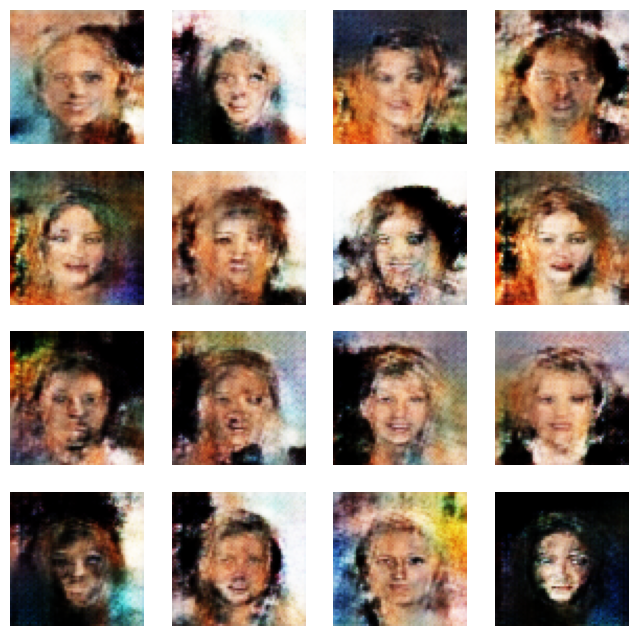

Time for epoch 351 is 4.95 sec
Epoch 351, Gen Loss: 1.8176, Disc Loss: 0.8239
Time for epoch 352 is 4.10 sec
Epoch 352, Gen Loss: 1.7993, Disc Loss: 0.7797
Time for epoch 353 is 5.11 sec
Epoch 353, Gen Loss: 1.8784, Disc Loss: 0.6596
Time for epoch 354 is 5.11 sec
Epoch 354, Gen Loss: 1.8552, Disc Loss: 0.6989
Time for epoch 355 is 4.11 sec
Epoch 355, Gen Loss: 1.8484, Disc Loss: 0.6882
Time for epoch 356 is 4.10 sec
Epoch 356, Gen Loss: 1.6820, Disc Loss: 0.8312
Time for epoch 357 is 5.12 sec
Epoch 357, Gen Loss: 1.7814, Disc Loss: 0.7614
Time for epoch 358 is 5.11 sec
Epoch 358, Gen Loss: 1.7543, Disc Loss: 0.8433
Time for epoch 359 is 4.05 sec
Epoch 359, Gen Loss: 1.8923, Disc Loss: 0.7031
Time for epoch 360 is 5.11 sec
Epoch 360, Gen Loss: 1.8698, Disc Loss: 0.7160
Time for epoch 361 is 5.12 sec
Epoch 361, Gen Loss: 2.0450, Disc Loss: 0.6571
Time for epoch 362 is 5.11 sec
Epoch 362, Gen Loss: 1.8179, Disc Loss: 0.7589
Time for epoch 363 is 5.12 sec
Epoch 363, Gen Loss: 1.8467, Disc

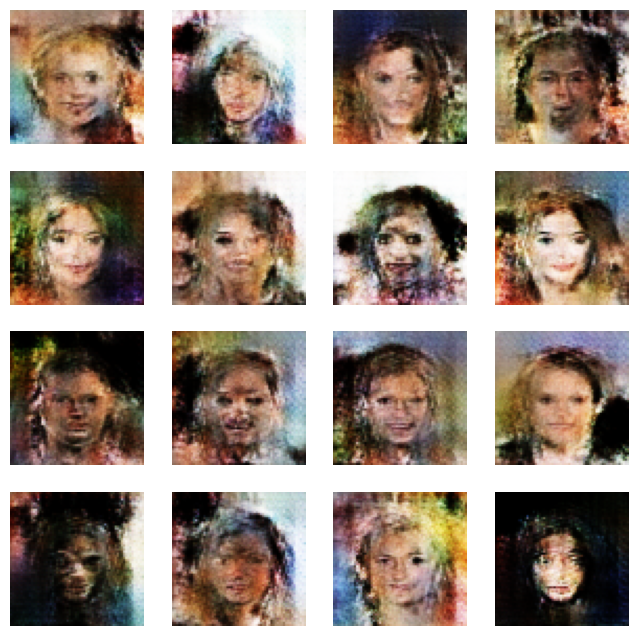

Time for epoch 401 is 5.74 sec
Epoch 401, Gen Loss: 2.0238, Disc Loss: 0.6608
Time for epoch 402 is 4.08 sec
Epoch 402, Gen Loss: 1.7987, Disc Loss: 0.7494
Time for epoch 403 is 5.11 sec
Epoch 403, Gen Loss: 1.9091, Disc Loss: 0.6700
Time for epoch 404 is 4.05 sec
Epoch 404, Gen Loss: 2.0707, Disc Loss: 0.7175
Time for epoch 405 is 5.11 sec
Epoch 405, Gen Loss: 1.9402, Disc Loss: 0.7860
Time for epoch 406 is 5.12 sec
Epoch 406, Gen Loss: 2.1051, Disc Loss: 0.6167
Time for epoch 407 is 4.06 sec
Epoch 407, Gen Loss: 2.3016, Disc Loss: 0.5074
Time for epoch 408 is 5.12 sec
Epoch 408, Gen Loss: 1.9397, Disc Loss: 0.7802
Time for epoch 409 is 4.07 sec
Epoch 409, Gen Loss: 1.9368, Disc Loss: 0.7166
Time for epoch 410 is 4.06 sec
Epoch 410, Gen Loss: 1.9633, Disc Loss: 0.7133
Time for epoch 411 is 4.14 sec
Epoch 411, Gen Loss: 1.8826, Disc Loss: 0.7456
Time for epoch 412 is 4.07 sec
Epoch 412, Gen Loss: 1.9628, Disc Loss: 0.7413
Time for epoch 413 is 4.07 sec
Epoch 413, Gen Loss: 1.8505, Disc

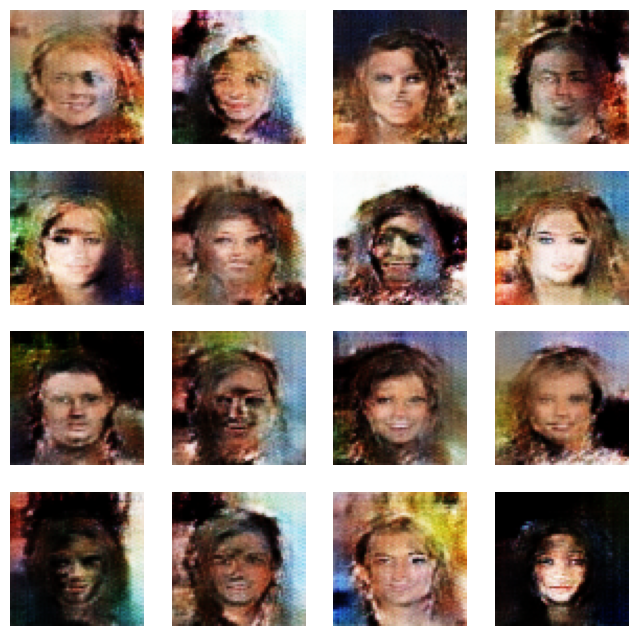

Time for epoch 451 is 4.68 sec
Epoch 451, Gen Loss: 1.8849, Disc Loss: 0.7087
Time for epoch 452 is 5.12 sec
Epoch 452, Gen Loss: 2.1686, Disc Loss: 0.6020
Time for epoch 453 is 4.19 sec
Epoch 453, Gen Loss: 1.9986, Disc Loss: 0.6336
Time for epoch 454 is 4.06 sec
Epoch 454, Gen Loss: 2.1148, Disc Loss: 0.6298
Time for epoch 455 is 4.07 sec
Epoch 455, Gen Loss: 2.0861, Disc Loss: 0.6276
Time for epoch 456 is 4.12 sec
Epoch 456, Gen Loss: 1.9017, Disc Loss: 0.8539
Time for epoch 457 is 4.04 sec
Epoch 457, Gen Loss: 2.1143, Disc Loss: 0.6539
Time for epoch 458 is 5.12 sec
Epoch 458, Gen Loss: 2.1955, Disc Loss: 0.6055
Time for epoch 459 is 4.05 sec
Epoch 459, Gen Loss: 2.1448, Disc Loss: 0.6125
Time for epoch 460 is 4.07 sec
Epoch 460, Gen Loss: 2.4363, Disc Loss: 0.5980
Time for epoch 461 is 4.15 sec
Epoch 461, Gen Loss: 1.8458, Disc Loss: 0.8043
Time for epoch 462 is 5.11 sec
Epoch 462, Gen Loss: 2.0408, Disc Loss: 0.6704
Time for epoch 463 is 5.12 sec
Epoch 463, Gen Loss: 2.2093, Disc

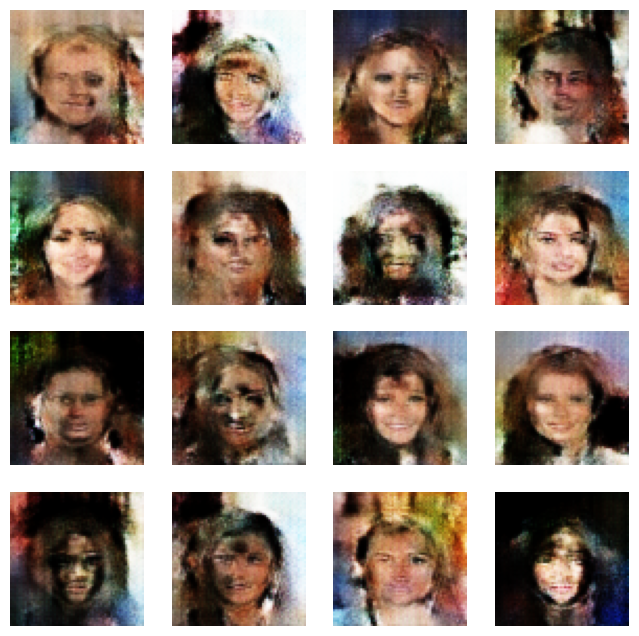

Time for epoch 501 is 5.75 sec
Epoch 501, Gen Loss: 2.2608, Disc Loss: 0.6229
Time for epoch 502 is 5.13 sec
Epoch 502, Gen Loss: 2.0128, Disc Loss: 0.6841
Time for epoch 503 is 5.11 sec
Epoch 503, Gen Loss: 2.2609, Disc Loss: 0.5832
Time for epoch 504 is 5.12 sec
Epoch 504, Gen Loss: 2.0447, Disc Loss: 0.7295
Time for epoch 505 is 4.05 sec
Epoch 505, Gen Loss: 1.9879, Disc Loss: 0.7749
Time for epoch 506 is 5.12 sec
Epoch 506, Gen Loss: 1.9597, Disc Loss: 0.7778
Time for epoch 507 is 5.11 sec
Epoch 507, Gen Loss: 2.1931, Disc Loss: 0.5457
Time for epoch 508 is 5.12 sec
Epoch 508, Gen Loss: 1.9797, Disc Loss: 0.7859
Time for epoch 509 is 5.11 sec
Epoch 509, Gen Loss: 2.0833, Disc Loss: 0.6765
Time for epoch 510 is 4.06 sec
Epoch 510, Gen Loss: 2.0665, Disc Loss: 0.7400
Time for epoch 511 is 4.13 sec
Epoch 511, Gen Loss: 2.2561, Disc Loss: 0.6532
Time for epoch 512 is 5.12 sec
Epoch 512, Gen Loss: 1.9451, Disc Loss: 0.7845
Time for epoch 513 is 4.10 sec
Epoch 513, Gen Loss: 2.1237, Disc

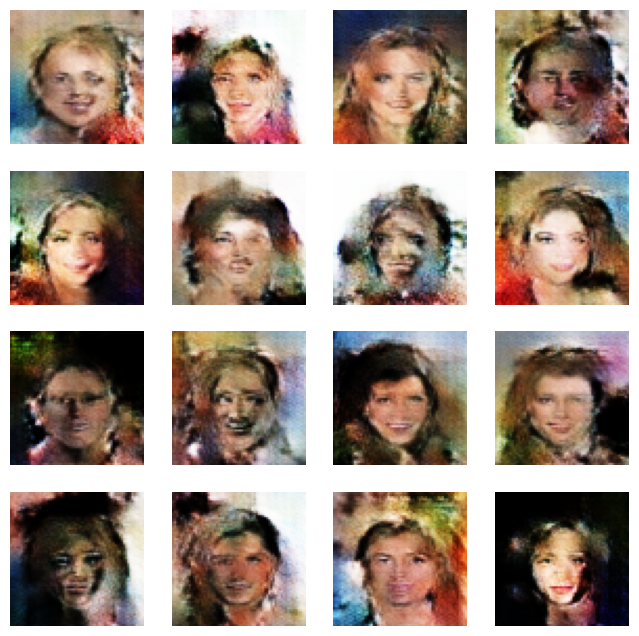

Time for epoch 551 is 4.69 sec
Epoch 551, Gen Loss: 2.1150, Disc Loss: 0.6852
Time for epoch 552 is 4.14 sec
Epoch 552, Gen Loss: 2.2334, Disc Loss: 0.5730
Time for epoch 553 is 5.12 sec
Epoch 553, Gen Loss: 1.9693, Disc Loss: 0.7453
Time for epoch 554 is 5.11 sec
Epoch 554, Gen Loss: 2.1837, Disc Loss: 0.6013
Time for epoch 555 is 5.12 sec
Epoch 555, Gen Loss: 2.2736, Disc Loss: 0.5371
Time for epoch 556 is 4.06 sec
Epoch 556, Gen Loss: 2.3466, Disc Loss: 0.6302
Time for epoch 557 is 5.11 sec
Epoch 557, Gen Loss: 2.3101, Disc Loss: 0.6896
Time for epoch 558 is 4.12 sec
Epoch 558, Gen Loss: 2.1201, Disc Loss: 0.7584
Time for epoch 559 is 5.11 sec
Epoch 559, Gen Loss: 2.3987, Disc Loss: 0.5129
Time for epoch 560 is 5.12 sec
Epoch 560, Gen Loss: 2.2003, Disc Loss: 0.6219
Time for epoch 561 is 4.05 sec
Epoch 561, Gen Loss: 2.2600, Disc Loss: 0.7334
Time for epoch 562 is 5.12 sec
Epoch 562, Gen Loss: 2.0228, Disc Loss: 0.6617
Time for epoch 563 is 5.12 sec
Epoch 563, Gen Loss: 2.1884, Disc

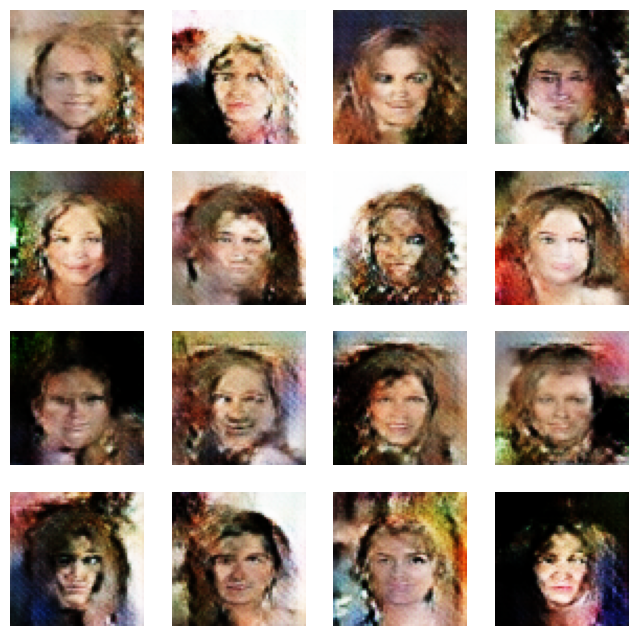

Time for epoch 601 is 4.73 sec
Epoch 601, Gen Loss: 2.3515, Disc Loss: 0.6016
Time for epoch 602 is 4.21 sec
Epoch 602, Gen Loss: 2.4679, Disc Loss: 0.5788
Time for epoch 603 is 4.05 sec
Epoch 603, Gen Loss: 2.2040, Disc Loss: 0.6972
Time for epoch 604 is 5.11 sec
Epoch 604, Gen Loss: 2.5054, Disc Loss: 0.5054
Time for epoch 605 is 4.10 sec
Epoch 605, Gen Loss: 2.4368, Disc Loss: 0.6220
Time for epoch 606 is 5.12 sec
Epoch 606, Gen Loss: 2.3506, Disc Loss: 0.5983
Time for epoch 607 is 5.11 sec
Epoch 607, Gen Loss: 2.1082, Disc Loss: 0.7754
Time for epoch 608 is 4.05 sec
Epoch 608, Gen Loss: 2.1951, Disc Loss: 0.6500
Time for epoch 609 is 5.11 sec
Epoch 609, Gen Loss: 2.3842, Disc Loss: 0.5689
Time for epoch 610 is 5.11 sec
Epoch 610, Gen Loss: 2.2613, Disc Loss: 0.6234
Time for epoch 611 is 5.11 sec
Epoch 611, Gen Loss: 2.2057, Disc Loss: 0.6889
Time for epoch 612 is 5.13 sec
Epoch 612, Gen Loss: 2.3218, Disc Loss: 0.6167
Time for epoch 613 is 4.05 sec
Epoch 613, Gen Loss: 2.3459, Disc

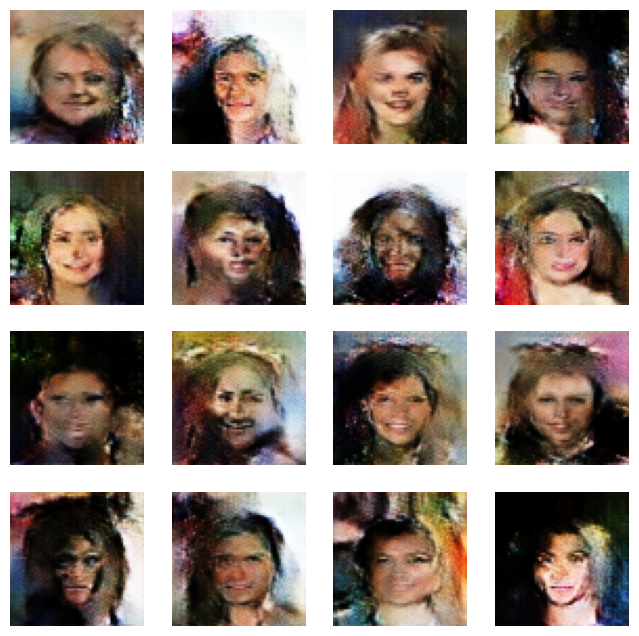

Time for epoch 651 is 4.77 sec
Epoch 651, Gen Loss: 2.1196, Disc Loss: 0.6847
Time for epoch 652 is 4.15 sec
Epoch 652, Gen Loss: 2.0865, Disc Loss: 0.7046
Time for epoch 653 is 5.11 sec
Epoch 653, Gen Loss: 1.9639, Disc Loss: 0.7690
Time for epoch 654 is 5.12 sec
Epoch 654, Gen Loss: 2.2891, Disc Loss: 0.7513
Time for epoch 655 is 4.07 sec
Epoch 655, Gen Loss: 2.3102, Disc Loss: 0.6444
Time for epoch 656 is 5.12 sec
Epoch 656, Gen Loss: 2.1032, Disc Loss: 0.6896
Time for epoch 657 is 4.07 sec
Epoch 657, Gen Loss: 2.1492, Disc Loss: 0.6903
Time for epoch 658 is 4.17 sec
Epoch 658, Gen Loss: 2.0648, Disc Loss: 0.7166
Time for epoch 659 is 5.11 sec
Epoch 659, Gen Loss: 2.3863, Disc Loss: 0.5921
Time for epoch 660 is 4.04 sec
Epoch 660, Gen Loss: 2.2555, Disc Loss: 0.6541
Time for epoch 661 is 4.12 sec
Epoch 661, Gen Loss: 2.0882, Disc Loss: 0.6864
Time for epoch 662 is 5.11 sec
Epoch 662, Gen Loss: 2.1680, Disc Loss: 0.8067
Time for epoch 663 is 5.12 sec
Epoch 663, Gen Loss: 2.1864, Disc

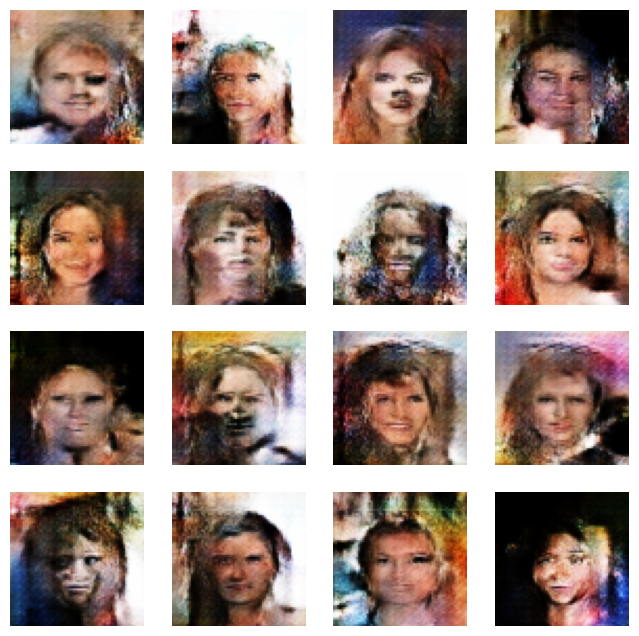

Time for epoch 701 is 6.11 sec
Epoch 701, Gen Loss: 2.3082, Disc Loss: 0.6059
Time for epoch 702 is 4.16 sec
Epoch 702, Gen Loss: 2.1722, Disc Loss: 0.6485
Time for epoch 703 is 4.05 sec
Epoch 703, Gen Loss: 2.1701, Disc Loss: 0.6522
Time for epoch 704 is 5.11 sec
Epoch 704, Gen Loss: 2.1300, Disc Loss: 0.6969
Time for epoch 705 is 4.06 sec
Epoch 705, Gen Loss: 2.1275, Disc Loss: 0.6367
Time for epoch 706 is 4.05 sec
Epoch 706, Gen Loss: 2.1894, Disc Loss: 0.6710
Time for epoch 707 is 5.12 sec
Epoch 707, Gen Loss: 2.0912, Disc Loss: 0.6661
Time for epoch 708 is 4.06 sec
Epoch 708, Gen Loss: 2.0531, Disc Loss: 0.6829
Time for epoch 709 is 4.10 sec
Epoch 709, Gen Loss: 2.2638, Disc Loss: 0.6212
Time for epoch 710 is 5.12 sec
Epoch 710, Gen Loss: 1.9375, Disc Loss: 0.7664
Time for epoch 711 is 5.11 sec
Epoch 711, Gen Loss: 2.0826, Disc Loss: 0.7127
Time for epoch 712 is 4.17 sec
Epoch 712, Gen Loss: 2.2020, Disc Loss: 0.6547
Time for epoch 713 is 5.12 sec
Epoch 713, Gen Loss: 1.9986, Disc

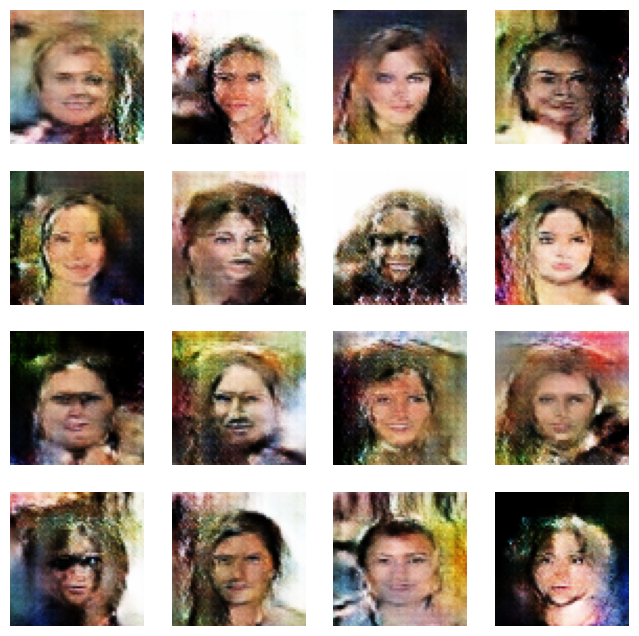

Time for epoch 751 is 4.69 sec
Epoch 751, Gen Loss: 2.0979, Disc Loss: 0.6954
Time for epoch 752 is 4.16 sec
Epoch 752, Gen Loss: 2.1190, Disc Loss: 0.7095
Time for epoch 753 is 5.12 sec
Epoch 753, Gen Loss: 2.3880, Disc Loss: 0.5933
Time for epoch 754 is 5.11 sec
Epoch 754, Gen Loss: 2.0327, Disc Loss: 0.7562
Time for epoch 755 is 5.11 sec
Epoch 755, Gen Loss: 2.1196, Disc Loss: 0.6739
Time for epoch 756 is 5.11 sec
Epoch 756, Gen Loss: 2.1304, Disc Loss: 0.7725
Time for epoch 757 is 4.07 sec
Epoch 757, Gen Loss: 2.0920, Disc Loss: 0.7862
Time for epoch 758 is 4.19 sec
Epoch 758, Gen Loss: 2.2931, Disc Loss: 0.6160
Time for epoch 759 is 5.12 sec
Epoch 759, Gen Loss: 1.9662, Disc Loss: 0.7654
Time for epoch 760 is 4.08 sec
Epoch 760, Gen Loss: 2.1305, Disc Loss: 0.6951
Time for epoch 761 is 5.12 sec
Epoch 761, Gen Loss: 2.3380, Disc Loss: 0.6387
Time for epoch 762 is 4.04 sec
Epoch 762, Gen Loss: 1.9631, Disc Loss: 0.8492
Time for epoch 763 is 4.16 sec
Epoch 763, Gen Loss: 2.0902, Disc

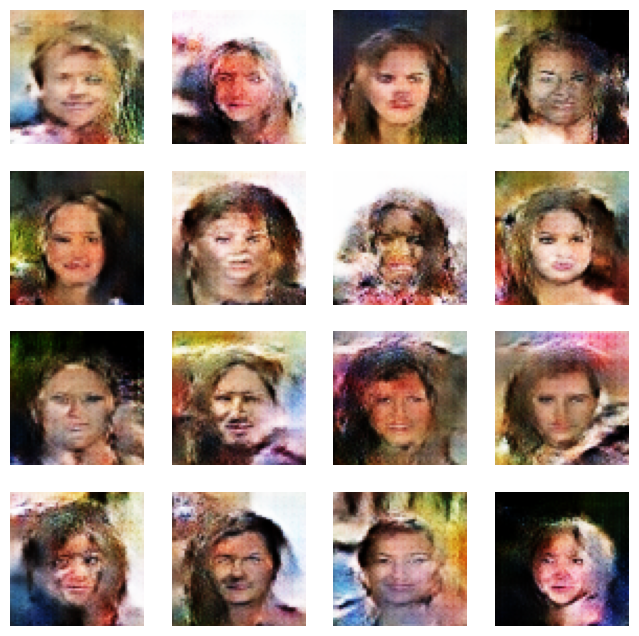

Time for epoch 801 is 5.77 sec
Epoch 801, Gen Loss: 2.0574, Disc Loss: 0.7638
Time for epoch 802 is 5.13 sec
Epoch 802, Gen Loss: 2.0494, Disc Loss: 0.6435
Time for epoch 803 is 4.19 sec
Epoch 803, Gen Loss: 2.0362, Disc Loss: 0.6951
Time for epoch 804 is 5.11 sec
Epoch 804, Gen Loss: 1.9803, Disc Loss: 0.7905
Time for epoch 805 is 4.09 sec
Epoch 805, Gen Loss: 2.2287, Disc Loss: 0.7529
Time for epoch 806 is 4.14 sec
Epoch 806, Gen Loss: 1.9973, Disc Loss: 0.8447
Time for epoch 807 is 5.12 sec
Epoch 807, Gen Loss: 2.2427, Disc Loss: 0.6275
Time for epoch 808 is 5.12 sec
Epoch 808, Gen Loss: 2.0279, Disc Loss: 0.6940
Time for epoch 809 is 5.11 sec
Epoch 809, Gen Loss: 2.0161, Disc Loss: 0.7073
Time for epoch 810 is 5.11 sec
Epoch 810, Gen Loss: 2.1398, Disc Loss: 0.7266
Time for epoch 811 is 4.08 sec
Epoch 811, Gen Loss: 2.1090, Disc Loss: 0.7555
Time for epoch 812 is 4.10 sec
Epoch 812, Gen Loss: 2.0917, Disc Loss: 0.6554
Time for epoch 813 is 5.11 sec
Epoch 813, Gen Loss: 2.4003, Disc

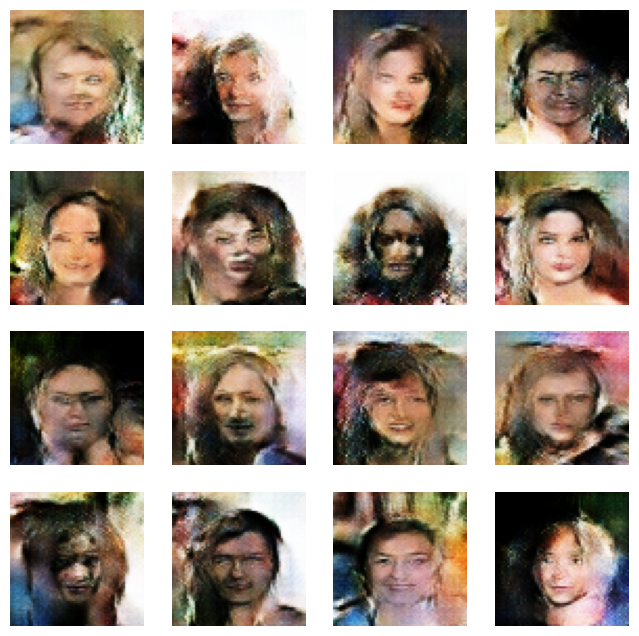

Time for epoch 851 is 4.83 sec
Epoch 851, Gen Loss: 2.1535, Disc Loss: 0.8171
Time for epoch 852 is 4.23 sec
Epoch 852, Gen Loss: 1.8160, Disc Loss: 0.8480
Time for epoch 853 is 4.07 sec
Epoch 853, Gen Loss: 2.0280, Disc Loss: 0.7144
Time for epoch 854 is 4.09 sec
Epoch 854, Gen Loss: 1.9255, Disc Loss: 0.8354
Time for epoch 855 is 4.19 sec
Epoch 855, Gen Loss: 1.9557, Disc Loss: 0.7807
Time for epoch 856 is 5.11 sec
Epoch 856, Gen Loss: 2.2996, Disc Loss: 0.6804
Time for epoch 857 is 4.06 sec
Epoch 857, Gen Loss: 1.9979, Disc Loss: 0.6963
Time for epoch 858 is 5.13 sec
Epoch 858, Gen Loss: 2.1394, Disc Loss: 0.7090
Time for epoch 859 is 5.11 sec
Epoch 859, Gen Loss: 2.1121, Disc Loss: 0.7207
Time for epoch 860 is 4.18 sec
Epoch 860, Gen Loss: 2.2021, Disc Loss: 0.6927
Time for epoch 861 is 5.11 sec
Epoch 861, Gen Loss: 2.0548, Disc Loss: 0.7314
Time for epoch 862 is 4.06 sec
Epoch 862, Gen Loss: 2.1638, Disc Loss: 0.5900
Time for epoch 863 is 4.13 sec
Epoch 863, Gen Loss: 2.0360, Disc

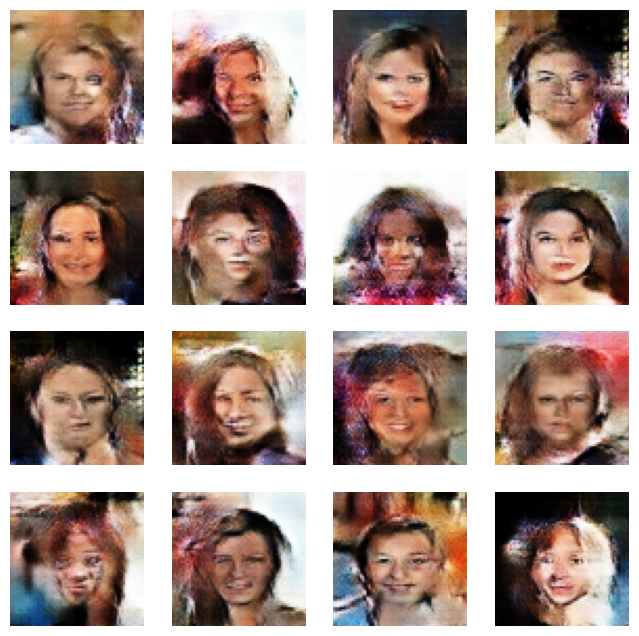

Time for epoch 901 is 4.83 sec
Epoch 901, Gen Loss: 2.2934, Disc Loss: 0.7204
Time for epoch 902 is 5.12 sec
Epoch 902, Gen Loss: 2.1804, Disc Loss: 0.7470
Time for epoch 903 is 5.11 sec
Epoch 903, Gen Loss: 2.3723, Disc Loss: 0.7770
Time for epoch 904 is 4.06 sec
Epoch 904, Gen Loss: 2.2772, Disc Loss: 0.8643
Time for epoch 905 is 5.12 sec
Epoch 905, Gen Loss: 1.8985, Disc Loss: 0.9722
Time for epoch 906 is 4.14 sec
Epoch 906, Gen Loss: 2.1959, Disc Loss: 0.7502
Time for epoch 907 is 4.06 sec
Epoch 907, Gen Loss: 2.4869, Disc Loss: 0.6454
Time for epoch 908 is 4.07 sec
Epoch 908, Gen Loss: 1.9989, Disc Loss: 0.8080
Time for epoch 909 is 4.17 sec
Epoch 909, Gen Loss: 2.0488, Disc Loss: 0.7282
Time for epoch 910 is 4.07 sec
Epoch 910, Gen Loss: 1.8611, Disc Loss: 0.8249
Time for epoch 911 is 5.11 sec
Epoch 911, Gen Loss: 2.0285, Disc Loss: 0.7084
Time for epoch 912 is 5.12 sec
Epoch 912, Gen Loss: 1.8409, Disc Loss: 0.8756
Time for epoch 913 is 4.05 sec
Epoch 913, Gen Loss: 1.8758, Disc

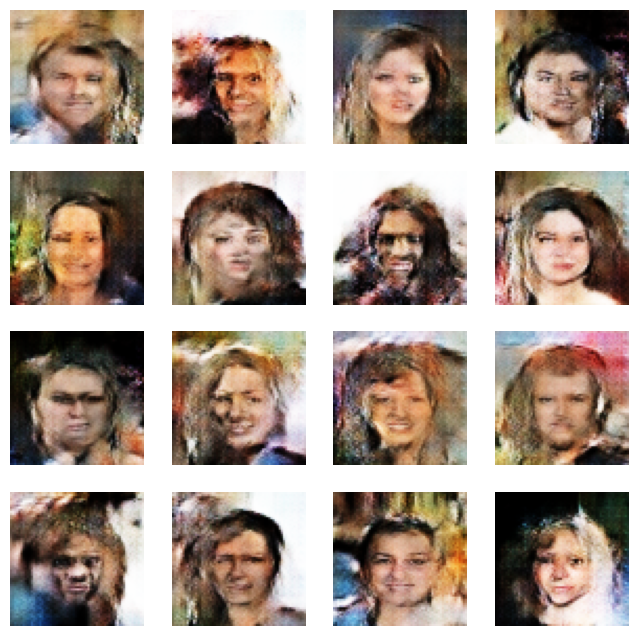

Time for epoch 951 is 5.32 sec
Epoch 951, Gen Loss: 2.1260, Disc Loss: 0.7152
Time for epoch 952 is 5.13 sec
Epoch 952, Gen Loss: 2.0179, Disc Loss: 0.6831
Time for epoch 953 is 5.12 sec
Epoch 953, Gen Loss: 2.0660, Disc Loss: 0.7181
Time for epoch 954 is 4.16 sec
Epoch 954, Gen Loss: 2.1544, Disc Loss: 0.7438
Time for epoch 955 is 4.07 sec
Epoch 955, Gen Loss: 2.0218, Disc Loss: 0.8483
Time for epoch 956 is 4.09 sec
Epoch 956, Gen Loss: 2.0896, Disc Loss: 0.7293
Time for epoch 957 is 4.11 sec
Epoch 957, Gen Loss: 2.0089, Disc Loss: 0.7632
Time for epoch 958 is 5.11 sec
Epoch 958, Gen Loss: 2.1569, Disc Loss: 0.6273
Time for epoch 959 is 5.11 sec
Epoch 959, Gen Loss: 1.9516, Disc Loss: 0.7272
Time for epoch 960 is 5.12 sec
Epoch 960, Gen Loss: 2.1261, Disc Loss: 0.7104
Time for epoch 961 is 4.06 sec
Epoch 961, Gen Loss: 1.8999, Disc Loss: 0.8872
Time for epoch 962 is 5.12 sec
Epoch 962, Gen Loss: 2.1091, Disc Loss: 0.6640
Time for epoch 963 is 5.12 sec
Epoch 963, Gen Loss: 2.0718, Disc

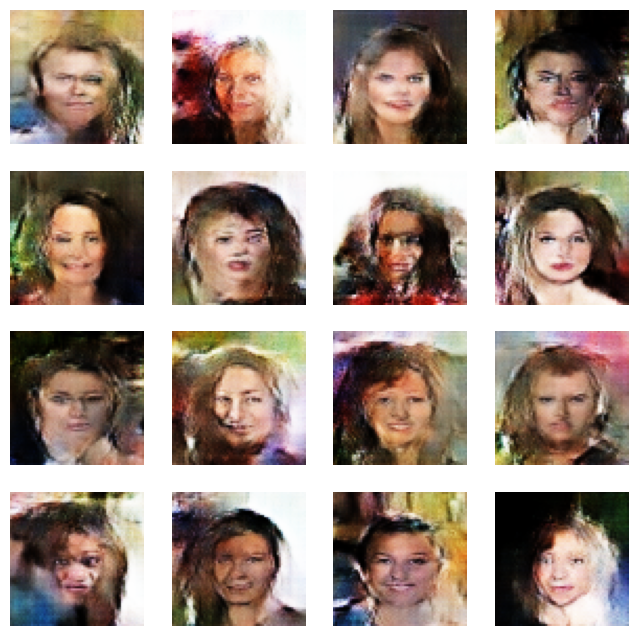

Time for epoch 1001 is 5.76 sec
Epoch 1001, Gen Loss: 1.8226, Disc Loss: 0.8974
Time for epoch 1002 is 5.12 sec
Epoch 1002, Gen Loss: 1.8451, Disc Loss: 0.8431
Time for epoch 1003 is 4.07 sec
Epoch 1003, Gen Loss: 1.7668, Disc Loss: 0.9186
Time for epoch 1004 is 5.12 sec
Epoch 1004, Gen Loss: 1.9179, Disc Loss: 0.7460
Time for epoch 1005 is 4.05 sec
Epoch 1005, Gen Loss: 1.8290, Disc Loss: 0.8179
Time for epoch 1006 is 4.07 sec
Epoch 1006, Gen Loss: 1.9335, Disc Loss: 0.7545
Time for epoch 1007 is 4.11 sec
Epoch 1007, Gen Loss: 2.0305, Disc Loss: 0.6879
Time for epoch 1008 is 4.06 sec
Epoch 1008, Gen Loss: 1.8863, Disc Loss: 0.8411
Time for epoch 1009 is 5.11 sec
Epoch 1009, Gen Loss: 2.0126, Disc Loss: 0.7398
Time for epoch 1010 is 4.05 sec
Epoch 1010, Gen Loss: 1.8766, Disc Loss: 0.7897
Time for epoch 1011 is 5.11 sec
Epoch 1011, Gen Loss: 1.7456, Disc Loss: 0.9281
Time for epoch 1012 is 4.17 sec
Epoch 1012, Gen Loss: 2.0412, Disc Loss: 0.8227
Time for epoch 1013 is 5.12 sec
Epoch 10

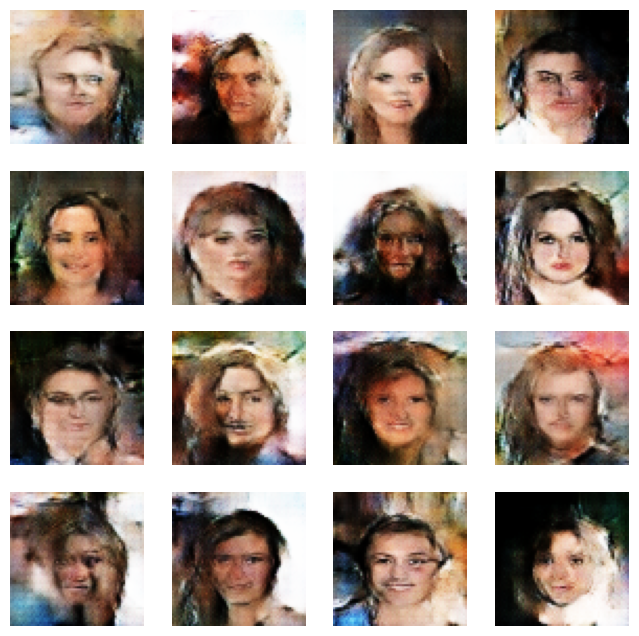

Time for epoch 1051 is 5.79 sec
Epoch 1051, Gen Loss: 2.1063, Disc Loss: 0.7717
Time for epoch 1052 is 4.24 sec
Epoch 1052, Gen Loss: 1.9365, Disc Loss: 0.7565
Time for epoch 1053 is 4.17 sec
Epoch 1053, Gen Loss: 1.9580, Disc Loss: 0.6695
Time for epoch 1054 is 5.11 sec
Epoch 1054, Gen Loss: 2.1092, Disc Loss: 0.6923
Time for epoch 1055 is 4.06 sec
Epoch 1055, Gen Loss: 1.9038, Disc Loss: 0.8148
Time for epoch 1056 is 5.13 sec
Epoch 1056, Gen Loss: 1.9269, Disc Loss: 0.8385
Time for epoch 1057 is 4.09 sec
Epoch 1057, Gen Loss: 1.9562, Disc Loss: 0.7234
Time for epoch 1058 is 4.10 sec
Epoch 1058, Gen Loss: 2.0612, Disc Loss: 0.6279
Time for epoch 1059 is 4.11 sec
Epoch 1059, Gen Loss: 2.0054, Disc Loss: 0.7618
Time for epoch 1060 is 5.11 sec
Epoch 1060, Gen Loss: 2.2730, Disc Loss: 0.6556
Time for epoch 1061 is 4.11 sec
Epoch 1061, Gen Loss: 1.9387, Disc Loss: 0.8537
Time for epoch 1062 is 5.11 sec
Epoch 1062, Gen Loss: 2.0933, Disc Loss: 0.7069
Time for epoch 1063 is 5.11 sec
Epoch 10

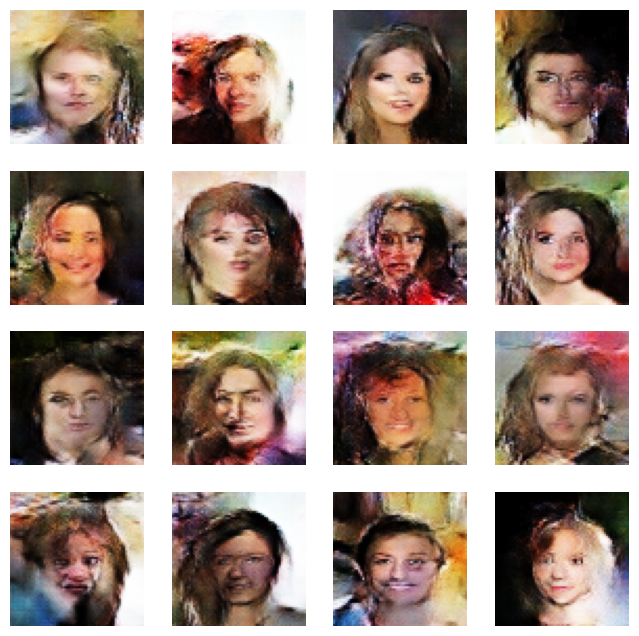

Time for epoch 1101 is 4.72 sec
Epoch 1101, Gen Loss: 1.8783, Disc Loss: 0.7721
Time for epoch 1102 is 5.12 sec
Epoch 1102, Gen Loss: 1.8705, Disc Loss: 0.7645
Time for epoch 1103 is 4.05 sec
Epoch 1103, Gen Loss: 1.8122, Disc Loss: 0.9343
Time for epoch 1104 is 5.11 sec
Epoch 1104, Gen Loss: 1.7276, Disc Loss: 0.8995
Time for epoch 1105 is 4.15 sec
Epoch 1105, Gen Loss: 1.9051, Disc Loss: 0.7268
Time for epoch 1106 is 4.06 sec
Epoch 1106, Gen Loss: 1.9169, Disc Loss: 0.7660
Time for epoch 1107 is 4.07 sec
Epoch 1107, Gen Loss: 1.8364, Disc Loss: 0.7991
Time for epoch 1108 is 5.12 sec
Epoch 1108, Gen Loss: 1.8674, Disc Loss: 0.8559
Time for epoch 1109 is 4.09 sec
Epoch 1109, Gen Loss: 1.8946, Disc Loss: 0.7591
Time for epoch 1110 is 5.12 sec
Epoch 1110, Gen Loss: 1.8976, Disc Loss: 0.7069
Time for epoch 1111 is 4.05 sec
Epoch 1111, Gen Loss: 1.9479, Disc Loss: 0.7772
Time for epoch 1112 is 4.04 sec
Epoch 1112, Gen Loss: 2.0034, Disc Loss: 0.9006
Time for epoch 1113 is 5.11 sec
Epoch 11

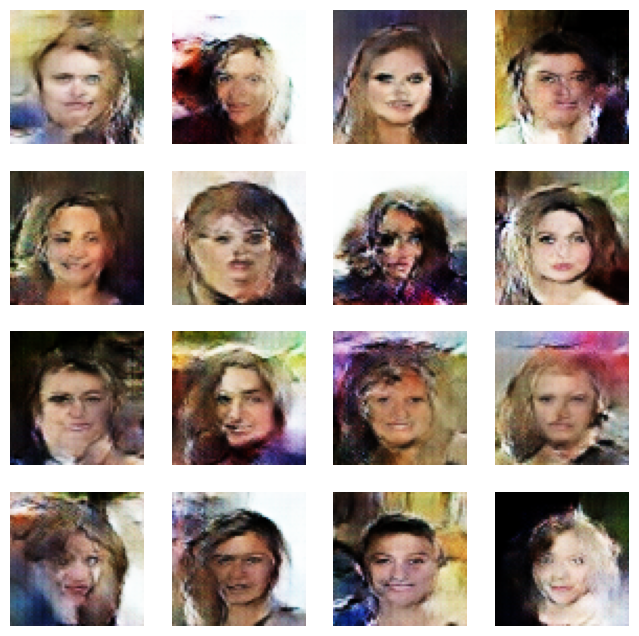

Time for epoch 1151 is 4.73 sec
Epoch 1151, Gen Loss: 1.9982, Disc Loss: 0.8035
Time for epoch 1152 is 5.12 sec
Epoch 1152, Gen Loss: 2.1767, Disc Loss: 0.6546
Time for epoch 1153 is 4.05 sec
Epoch 1153, Gen Loss: 1.8397, Disc Loss: 0.8824
Time for epoch 1154 is 4.09 sec
Epoch 1154, Gen Loss: 2.0161, Disc Loss: 0.7580
Time for epoch 1155 is 4.15 sec
Epoch 1155, Gen Loss: 2.0514, Disc Loss: 0.7395
Time for epoch 1156 is 4.05 sec
Epoch 1156, Gen Loss: 2.0861, Disc Loss: 0.7410
Time for epoch 1157 is 5.11 sec
Epoch 1157, Gen Loss: 2.0353, Disc Loss: 0.7610
Time for epoch 1158 is 5.11 sec
Epoch 1158, Gen Loss: 2.1028, Disc Loss: 0.6137
Time for epoch 1159 is 4.04 sec
Epoch 1159, Gen Loss: 1.9706, Disc Loss: 0.7076
Time for epoch 1160 is 4.17 sec
Epoch 1160, Gen Loss: 1.9630, Disc Loss: 0.8529
Time for epoch 1161 is 5.11 sec
Epoch 1161, Gen Loss: 2.1759, Disc Loss: 0.7731
Time for epoch 1162 is 4.05 sec
Epoch 1162, Gen Loss: 2.2630, Disc Loss: 0.7440
Time for epoch 1163 is 4.12 sec
Epoch 11

In [12]:
import time
# Training Parameters
epochs = 1200
batch_size = 128
seed = tf.random.normal([16, 100])  # Fixed noise for consistent image generation

# Training Step
@tf.function
def train_step(images):
    noise = tf.random.normal([batch_size, 100])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_images = generator(noise, training=True)
        real_output = discriminator(images, training=True)
        fake_output = discriminator(generated_images, training=True)

        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)

    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

    return gen_loss, disc_loss  # Fix: Removed .numpy()

# Save and Display Generated Images
def save_generated_images(epoch, generator, seed):
    generated_images = generator(seed, training=False)

    # Normalize images to [0,1] for proper display
    generated_images = (generated_images + 1) / 2.0

    fig, axes = plt.subplots(4, 4, figsize=(8, 8))
    for i, ax in enumerate(axes.flatten()):
        ax.imshow(generated_images[i])
        ax.axis('off')

    plt.savefig(f'generated_epoch_{epoch}.png')
    plt.show()

# Training Loop
def train(dataset, epochs):
    history = {'g_loss': [], 'd_loss': []}

    for epoch in range(epochs):
        start = time.time()

        gen_loss_epoch = 0
        disc_loss_epoch = 0
        batch_count = 0

        for image_batch in dataset:
            gen_loss, disc_loss = train_step(image_batch)
            gen_loss_epoch += gen_loss.numpy()
            disc_loss_epoch += disc_loss.numpy()
            batch_count += 1

        gen_loss_epoch /= batch_count
        disc_loss_epoch /= batch_count

        history['g_loss'].append(gen_loss_epoch)
        history['d_loss'].append(disc_loss_epoch)

        print(f"Epoch {epoch}, Gen Loss: {gen_loss_epoch:.4f}, Disc Loss: {disc_loss_epoch:.4f}")

        if epoch % 50 == 0:
            print(f"Epoch {epoch}, Generating Images...")
            save_generated_images(epoch, generator, seed)

        print(f"Time for epoch {epoch + 1} is {time.time()-start:.2f} sec")

    return history

# Start Training
history = train(data, epochs)


---

### 🧪 **Tracking Progress – Are We Winning?**  
1️⃣ At the beginning, **images look like noise**.  
2️⃣ By 200-300 epochs, **some blurry face-like structures appear**.  
3️⃣ By 600+ epochs, **clearer facial features emerge**.  
4️⃣ **After 1,200 epochs**, the Generator creates **lifelike human faces!** 🎨🔥  

---


👀 **Sit back and let the AI work its magic!** 🎬🔥

## 📊 **Step 8: Evaluating the GAN – How Well Did It Learn?** 🎯  

After training, we need to **analyze the performance** of our **Generator** and **Discriminator** by plotting their losses over time.  

---

### 🎯 **What Do We Expect in the Loss Graph?**  

1️⃣ **Discriminator Loss (🔵 Blue Line)**  
   - Starts high but **stabilizes** as training progresses.  
   - If it **drops too low**, the Discriminator is too strong (easily detects fakes).  
   - If it **rises too high**, the Generator is winning too easily.  

2️⃣ **Generator Loss (🟠 Orange Line)**  
   - Starts high and **gradually decreases** as images improve.  
   - If it **drops too low**, the Generator is too strong (creating almost perfect images).  
   - If it **rises too high**, the Discriminator is winning (the Generator is failing).  

3️⃣ **Balanced Competition = Best Results** 🎭  
   - Ideally, both losses **stabilize** around a balanced range.  
   - This means the GAN has reached a state where the **Generator** creates images that **challenge the Discriminator**, leading to **realistic outputs**.  

---


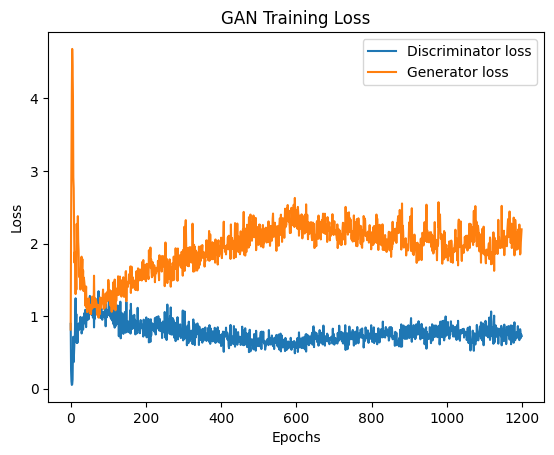

In [14]:
# Plot Losses
plt.plot(history['d_loss'], label='Discriminator loss')
plt.plot(history['g_loss'], label='Generator loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('GAN Training Loss')
plt.show()

## **👀 Interpretation of the Graph:**  

✅ **Is the Generator Learning Properly?**  
- **Partially.** The Generator loss initially decreased (good), but then it started increasing.  
- This suggests that the Generator **struggled to improve further** as the Discriminator got stronger.  
- It may indicate that the generated images are still **not high quality**.  

✅ **Is the Discriminator Too Strong or Too Weak?**  
- The Discriminator's loss **stabilized around 0.5 - 1.0**, meaning it is neither too strong nor too weak.  
- However, since the Generator loss increased over time, the Discriminator **might be slightly too strong**, making it hard for the Generator to improve.  

✅ **Do Both Losses Stabilize Over Time?**  
- **Not completely.** The Discriminator loss is relatively stable, but the Generator loss is still increasing.  
- This means the training is **not yet balanced**, and the Generator is still struggling to fool the Discriminator.  

---



### 🔍 **What Could Be Improved On?** 🚀  

📚 **More Research Needed!** 🤓  
I need to explore additional techniques and strategies to enhance my model's performance. This includes:  
🔹 **Tuning hyperparameters** 🎛️ – Adjusting learning rates, batch sizes, and optimizers.  
🔹 **Exploring alternative architectures** 🏗️ – Trying different GAN variations (DCGAN, WGAN, etc.).  
🔹 **Improving data augmentation** 🖼️ – Enhancing the dataset to help the Generator learn better.  

💡 **Asking for Guidance!** 🎓  
I’ll also **consult my Tutor @Daveworld** 🧑‍🏫 to get valuable insights and feedback. His expertise will help me identify what needs to be **fine-tuned** for better results.  

🔥 **Next Steps: Keep Improving & Experimenting!** 🛠️  
The journey doesn’t stop here! I’ll continue iterating and refining my GAN model until I get **high-quality outputs!** 💪🚀✨  


## 🎨  **Step 9: Testing the Generator – Did It Learn to Create Realistic Images? 🖼️**

Now that training is complete, it's time to test our Generator and see if it can produce realistic images!

In [15]:
# Test the generator
# Our  LATENT_DIM is defined
LATENT_DIM = 100
## To generate random noise
noise = tf.random.normal([25, LATENT_DIM])

# Generate images using the trained generator
generated_images = generator(noise, training=False)

# Denormalize images for correct visualization
generated_images = (generated_images * 127.5) + 127.5




# **🎯 Next Step – Let’s See the Magic! 🔥**
Now, I will plot the generated images to evaluate their quality and realism!

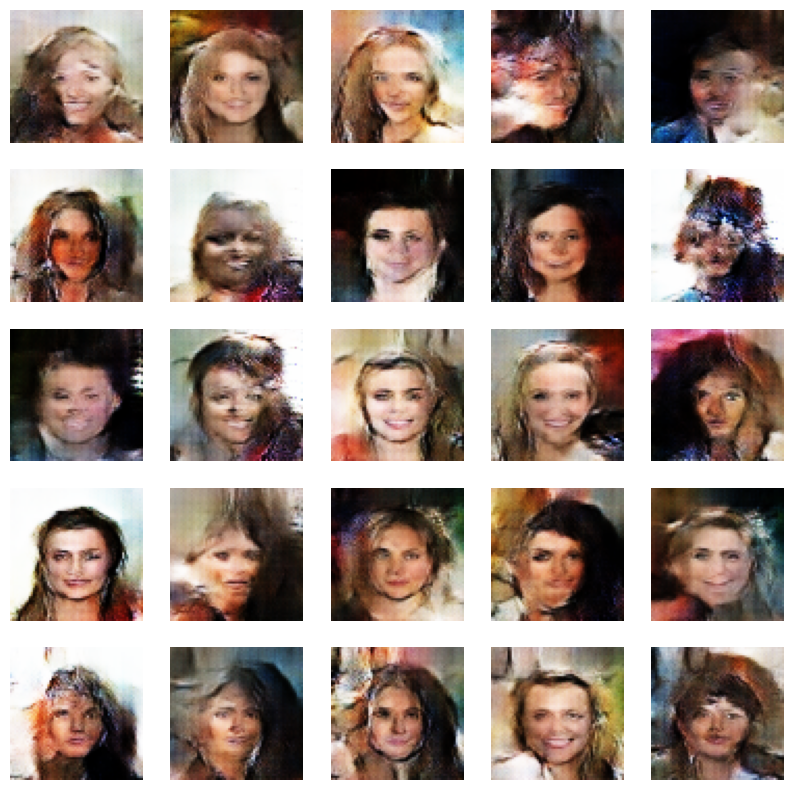

In [18]:
# Display generated images
plt.figure(figsize=(10, 10))
for i in range(25):
    plt.subplot(5, 5, i + 1)
    plt.imshow(generated_images[i].numpy().astype("uint8"))
    plt.axis("off")
plt.show()

### 🔍 **Evaluation of Generated Faces**  

My GAN has produced **somewhat recognizable human-like faces**, but there are still areas for improvement.  

---

### ✅ **What’s Good?**  
✔️ **Basic facial structure** is present (eyes, nose, mouth, hair).  
✔️ **Diversity** – Different facial features and hairstyles.  
✔️ **Color tones** are balanced, avoiding extreme distortions.  

---

### ⚠️ **What Needs Improvement?**  
❌ **Blur and Artifacts** – Many faces are blurry and have noticeable smudging.  
❌ **Asymmetry** – Some faces look warped or have unnatural distortions.  
❌ **Unclear details** – Some facial features are not well-defined, especially the eyes and mouth.  
❌ **Background blending** – The edges of the faces merge with unclear surroundings.  

---

### 🎯 **Why Is This Happening?**  
I will ask my Tutor or ask Chatgpt.

### 🔥 **Final Thoughts**  
I am on the **right track**! 🎉 I just need to  keep tweaking and training, and I'll get there! 😃

In [20]:
from google.colab import auth
auth.authenticate_user()
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [21]:
generator.save("/content/drive/My Drive/GenFace_gan_generator.h5")